# Motion of a charged particle in a constant orthogonal electromagnetic field
<br/>
<center> Novia Deng

## Differential Equations of Particle Motion
Now there is a charged particle of negligible gravity in an orthogonal electromagnetic field. The charge of the particle is q, the strength of the electric field is E, and the strength of the magnetic field is B.<br>
The left figure is an sample image, and the right diagram is the electromagnetic field corresponding to the X-Y plane.

<a href="https://imgbb.com/"><img src="https://i.ibb.co/ZMH0vbS/E2.jpg" alt="E2" border="0" width=35% align=left /></a>
<a href="https://imgbb.com/"><img src="https://i.ibb.co/vBNdfq9/E.jpg" alt="E" border="0" width=35% align=right/></a>

Because gravity is neglected, the particle is only affected by the electric field force and the Lorentz force, according to Newton's second law we can write:

$$
m\vec{a}=\vec{F_{total}}=q\vec{E}+q\vec{v}\times \vec{B} \tag{1}
$$

Taking the above figure as an example, the electric and magnetic fields are:

$$
\begin{align}
\vec{E}=(E,0,0) \\
\vec{B}=(0,0,-B)
\end{align}
$$

Define the displacement as $\vec{s} = (x,y,z)$, and rewrite equation (1) as a differential equation:

$$
m\frac{d^2\vec{s}}{dt^2}=q\vec{E}+q\frac{d\vec{s}}{dt}\times\vec{B} \tag{2}
$$

Operate the cross product of vectors in equation (2) and write it in the form of components.

$$
\begin{cases}
m\frac{d^2x}{dt^2}&=&qE-qB\frac{dy}{dt} \\
m\frac{d^2y}{dt^2}&=&qB\frac{dx}{dt}\\
m\frac{d^2z}{dt^2}&=&0 \tag{3}
\end{cases}
$$

To solve a second order differential equation, we introduce the first derivative (which here is velocity) as an auxiliary variable:
$$
\begin{cases}
\dot{v}_x(t) &=  \frac{qE}{m}-\frac{qB}{m}v_y(t) \\
\dot{x}(t) &= v_x(t) \\
\dot{v}_y(t) &= \frac{qB}{m}v_x(t)  \\
\dot{y}(t) &= v_y(t) \\
\dot{v}_z(t) &= 0 \\
\dot{z}(t) &= v_z(t) \tag{4}
\end{cases}
$$


## Solve ODE Equations
We assume that the values of electric field strength (E), magnetic field strength (B), charge (q) and mass (m) are all 1. And I will use two methods to show it.

### SciPy Method

In [1]:
import numpy as np
import pylab as py
from scipy.integrate import odeint

def deriv(s,t):
    vx=s[0]
    x=s[1]
    vy=s[2]
    y=s[3]
    vz=s[4]
    z=s[5]
    deriv = [q*E/m-q*B/m*vy,vx,q*B/m*vx,vy,0,vz]
    return deriv

def odientfun(f,initial,tmin,tmax,nts,q,E,B,m):
    t=np.linspace(tmin,tmax,nts)
    s=odeint(f,initial,t)
    return t,s

### Euler Method

In [2]:
def Eulerfun(time,vx0,x0,vy0,y0,vz0,z0):
    dt=time[1]-time[0]
    vx[0]=vx0
    x[0]=x0
    vy[0]=vy0
    y[0]=y0
    vz[0]=vz0
    z[0]=z0
    
    for i in range(len(time)-1):
        vx[i+1]=vx[i]+(q*E/m-q*B*vy[i]/m)*(dt)
        x[i+1]=x[i]+vx[i]*(dt)
        vy[i+1]=vy[i]+(q*B*vx[i]/m)*(dt)
        y[i+1]=y[i]+vy[i]*dt
        vz[i+1]=vz[i]
        z[i+1]=z[i]+vz[i]*dt
    return x,y,z

### Real Value
After the mathematical operation, the real equation of motion can be obtained. They can be represented by the following code:

In [3]:
def real(q,E,B,m,vx0,vy0,vz0,tmin,tmax,nts):
    a=q*E/m
    b=q*B/m
    A=vx0
    B=vy0
    
    t=np.linspace(tmin, tmax, nts)
    
    yreal = (A*b + a*b*t - A*b*np.cos(b*t) - a*np.sin(b*t) + b*B*np.sin(b*t))/(b**2)
    xreal = (-b*B - a*np.cos(b*t) + b*B*np.cos(b*t) + a*(np.cos(b*t))**2 + A*b*np.sin(b*t)\
             + a*(np.sin(b*t))**2)/(b**2)
    zreal = vz0*t
    
    return xreal, yreal, zreal

### Case 1
There is velocity only along the y-axis direction, and the velocity is zero in all other directions. All particles start from the origin and observe the trajectory formed by different $v_y$.

$v_y=-1,0,0.5,\frac{E}{B}=1,2,3$

**SciPy Method**

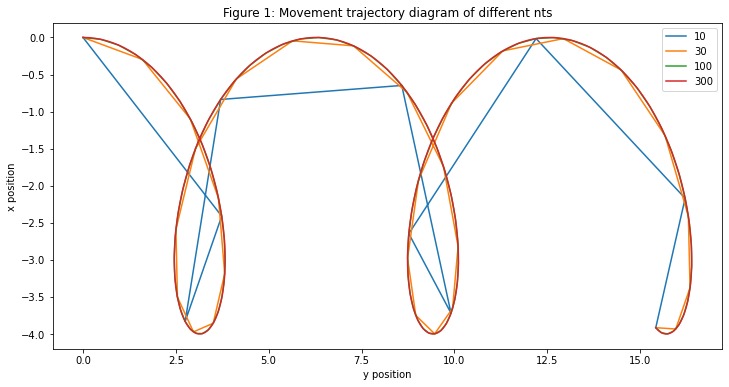

In [4]:
B,E,m,q=1,1,1,1
tmin,tmax=0,16
nts=[10,30,100,300]

for i in range(4):
    initial=[0,0,3,0,0,0]
    (t,s)=odientfun(deriv,initial,tmin,tmax,nts[i],q,E,B,m)
    x=s[:,1]
    y=s[:,3]
    py.rcParams["figure.figsize"] = (12, 6)
    py.plot(y,x,label=nts[i])
    py.xlabel('y position')
    py.ylabel("x position")

py.legend()
py.title('Figure 1: Movement trajectory diagram of different nts')
py.show()

Figure 1 shows that as nts increases, the images are gradually similar, thus reducing the error. When the nts is 100 and 300, the curves formed basically overlap, indicating that the error is relatively small at this time.

So next I will take nts equal to 300 and study the error image generated at this point.

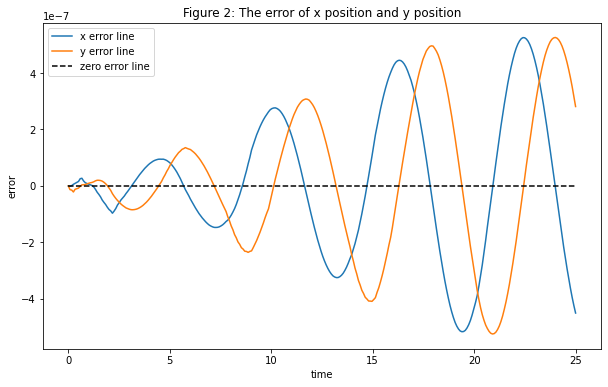

In [5]:
B,E,m,q=1,1,1,1
tmin,tmax,nts=0,25,300

initial=[0,0,3,0,0,0]
(t,s)=odientfun(deriv,initial,tmin,tmax,nts,q,E,B,m)
x=s[:,1]
y=s[:,3]

# then use real() function to calculate the real value
vx0,vy0,vz0=0,3,0
(xreal, yreal, zreal)=real(q,E,B,m,vx0,vy0,vz0,tmin,tmax,nts)

# get the error
xerr=(xreal-x)
yerr=(yreal-y)

py.rcParams["figure.figsize"] = (10, 6)
py.plot(t,xerr,label="x error line")
py.plot(t,yerr,label="y error line")

py.plot([0,25],[0,0],'k--',label='zero error line')
py.xlabel('time')
py.ylabel("error")
py.legend()
py.title('Figure 2: The error of x position and y position')
py.show()

We can find that the error magnitudes of x and y are both in the $10^{-7}$, which is very small. It can be seen that the error lines of x position and y position are very similar to the starting images of the RC sine wave oscillation circuit, both of which show a gradual increase in amplitude as time increases.

And we can also find an interesting point is that whenever the error of x is about 0, the error of y will reach an extreme value. Similarly when the error of y is about 0, the error of x will also reach an extreme value. This is similar to the relationship between sine and cosine curves.

After analyzing the error we can see how the trajectory will be produced with different initial velocities, keeping nts equal to 300.

In [6]:
import plotly.graph_objects as go

B,E,m,q=1,1,1,1
tmin,tmax,nts=0,16,300
fig1 = go.Figure()
fig2 = go.Figure()
fig3 = go.Figure()
Vy=[-1,0,0.5,1,1.5,2,3]

for i in range(7):
    initial=[0,0,Vy[i],0,0,0]
    (t,s)=odientfun(deriv,initial,tmin,tmax,nts,q,E,B,m)
    x=s[:,1]
    y=s[:,3]
    fig1.add_trace(go.Scatter(x=t, y=x, mode='lines', name=Vy[i]))
    fig2.add_trace(go.Scatter(x=t, y=y, mode='lines', name=Vy[i]))
    fig3.add_trace(go.Scatter(x=y, y=x, mode='lines', name=Vy[i]))

fig1.update_layout(title='Figure 3: x position with different initial velocity',
                   xaxis_title='time',
                   yaxis_title='x position')
fig1.show()

fig2.update_layout(title='Figure 4: y position with different initial velocity',
                   xaxis_title='time',
                   yaxis_title='y position')
fig2.show()

fig3.update_layout(title='Figure 5: SciPy Methon',
                   xaxis_title='y position',
                   yaxis_title='x position')
fig3.show()

**From figure 3 and 4:**

(1) When the initial velocity $V_y(0)$ is equal to $\frac{E}{B}=1$, no displacement occurs in the x-direction, the particle moves in a straight line along the y-axis direction(purpose line).

(2) When the $V_y(0)$ is less than $\frac{E}{B}$, the particle moves in the region of x positive semi-axis.

(3) When the $V_y(0)$ is large than $\frac{E}{B}$, the particle moves in the region of x negative semi-axis.

(4) The image is symmetric about the line formed at $V_y(0)=\frac{E}{B}$, and when |$V_y(0)-\frac{E}{B}$| is larger, the amplitude is also larger.

**From figure 5:**

(1) When |$V_y(0)-\frac{E}{B}$| is larger, the amplitude is larger. And when |$V_y(0)-\frac{E}{B}$| of two lines are the same, the two trajectories have the same shape but there is a phase shift (eg: -1 line and 3 line).

**Euler Method**

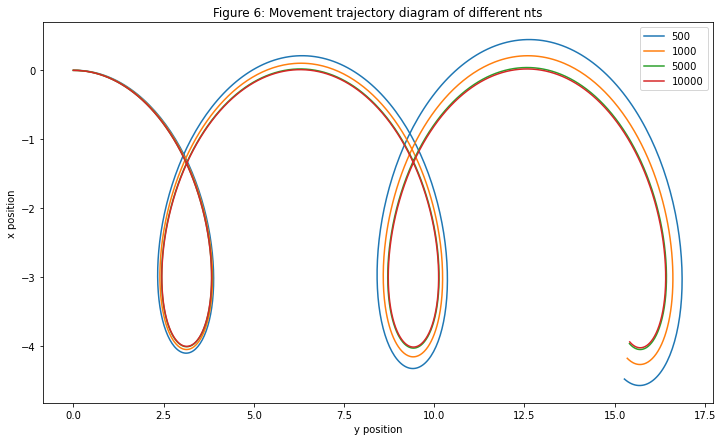

In [7]:
B,E,m,q=1,1,1,1
tmin,tmax=0,16
nts=[500,1000,5000,10000]

for j in range(4):
    time = np.linspace(tmin, tmax, nts[j])
    vx=np.zeros(time.size)
    x=np.zeros(time.size)
    vy=np.zeros(time.size)
    y=np.zeros(time.size)
    vz=np.zeros(time.size)
    z=np.zeros(time.size)

    vx0,x0,vy0,y0,vz0,z0=0,0,3,0,0,0
    (x,y,z) = Eulerfun(time,vx0,x0,vy0,y0,vz0,z0)
    py.rcParams["figure.figsize"] = (12, 7)
    py.plot(y,x,label=nts[j])
    
py.xlabel('y position')
py.ylabel("x position")
py.title('Figure 6: Movement trajectory diagram of different nts')
py.legend()
py.show()

From figure 6, as nts increases, the overlap of lines in the plot becomes higher, indicating that the error is gradually decreasing.

Thus, we will take nts equal to 10000 to perform the error analysis.

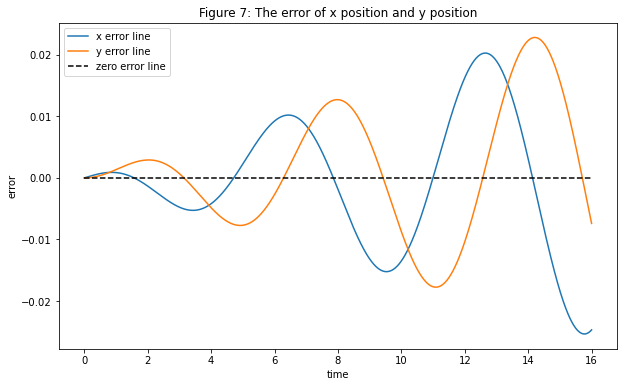

In [8]:
B,E,m,q=1,1,1,1
tmin,tmax,nts=0,16,10000
time = np.linspace(tmin, tmax, nts)

vx=np.zeros(time.size)
x=np.zeros(time.size)
vy=np.zeros(time.size)
y=np.zeros(time.size)
vz=np.zeros(time.size)
z=np.zeros(time.size)

vx0,x0,vy0,y0,vz0,z0=0,0,3,0,0,0
(x,y,z)=Eulerfun(time,vx0,x0,vy0,y0,vz0,z0)

# then use real() function to calculate the real value
(xreal, yreal, zreal)=real(q,E,B,m,vx0,vy0,vz0,tmin,tmax,nts)

xerr=x-xreal
yerr=y-yreal

py.rcParams["figure.figsize"] = (10, 6)
py.plot(time,xerr,label="x error line")
py.plot(time,yerr,label="y error line")

py.plot([0,16],[0,0],'k--',label='zero error line')
py.xlabel('time')
py.ylabel("error")
py.title('Figure 7: The error of x position and y position')
py.legend()
py.show()

As in image 2, the error lines for both x and y positions show a gradual increase in amplitude with increasing time. And the error in y will reach an extreme value whenever the error in x is approximately 0. Similarly, when the error of y is about 0, the error of x will also reach an extreme value.

Obviously, although the nts is 10000, which is much larger than the nts of SciPy method, the order of magnitude of Euler error is indeed $10^{-2}$ which is much larger than the error generated by SciPy method. Therefore, it is more convenient to use SciPy method and the error is smaller.

In [9]:
B,E,m,q=1,1,1,1
tmin,tmax,nts=0,16,10000
time = np.linspace(tmin, tmax, nts)

vx=np.zeros(time.size)
x=np.zeros(time.size)
vy=np.zeros(time.size)
y=np.zeros(time.size)
vz=np.zeros(time.size)
z=np.zeros(time.size)

Vy0=[-1,0,0.5,1,1.5,2,3]

fig = go.Figure()
for j in range(7):
    vx0,x0,y0,vz0,z0=0,0,0,0,0
    vy0=Vy0[j]
    (x,y,z)=Eulerfun(time,vx0,x0,vy0,y0,vz0,z0)
    fig.add_trace(go.Scatter(x=y, y=x,
                    mode='lines',
                    name=Vy[j]))

fig.update_layout(title='Figure 8: Euler Methon',
                   xaxis_title='y position',
                   yaxis_title='x position')
fig.show()


It can be found that the trajectories plotted by the two methods are very similar.

### Case 2
Now let's make the $v_y$ fixed and make it have a velocity along the x-axis and again observe the formed trajectory.

Based on the conclusions obtained in Case 1, we will then only use SciPy Method to solve the problem.

In [10]:
B,E,m,q=1,1,1,1
tmin,tmax,nts=0,14,100
fig1 = go.Figure()
fig2 = go.Figure()
fig3 = go.Figure()

Vx=[5,25,50]

for j in range(3):
    initial=[Vx[j],0,1,0,0,0]

    (t,s)=odientfun(deriv,initial,tmin,tmax,nts,q,E,B,m)
    x=s[:,1]
    y=s[:,3]
    fig1.add_trace(go.Scatter(x=t, y=x, mode='lines', name=Vx[j]))
    fig2.add_trace(go.Scatter(x=t, y=y, mode='lines', name=Vx[j]))
    fig3.add_trace(go.Scatter(x=y, y=x, mode='lines', name=Vx[j]))

fig1.update_layout(title='Figure 9: x position with different initial velocity',
                   xaxis_title='time',
                   yaxis_title='x position')
fig1.show()

fig2.update_layout(title='Figure 10: y position with different initial velocity',
                   xaxis_title='time',
                   yaxis_title='y position')
fig2.show()

fig3.update_layout(title='Figure 11: Case 2',
                   xaxis_title='y position',
                   yaxis_title='x position')
fig3.show()

**Figure 9 and 10:**

The plots of x position and y postion are similar to the sine image and the amplitude increases as $V_x(0)$ increases.

**Figure 11:**

When the difference between $V_x(0)$ and $V_x(0)$ is larger, the image becomes more like a circle.

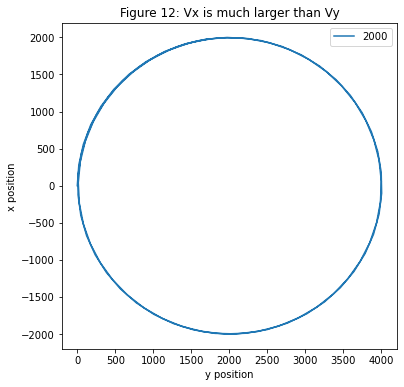

In [11]:
initial=[2000,0,2,0,0,0]

B,E,m,q=1,1,1,1
(t,s)=odientfun(deriv,initial,tmin,tmax,nts,q,E,B,m)
x=s[:,1]
y=s[:,3]

py.rcParams["figure.figsize"] = (6, 6)
py.plot(y,x,label='2000')
py.title("Figure 12: Vx is much larger than Vy")
py.xlabel('y position')
py.ylabel("x position")
py.legend()

py.show()

When $V_x(0)$ is much larger than $V_y(0)$, the trajectory of the particle is very close to a circle with a radius approximating the value of $V_x(0)$.

### Case 3
Now we let the particles have velocities in x, y, z directions so that we can form 3D trajectory images.

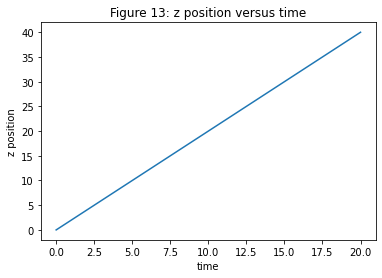

In [12]:
import plotly.graph_objects as go

B,E,m,q=1,1,1,1

initial=[5,0,5,0,2,0]
tmin,tmax,nts=0,20,100

(t,s)=odientfun(deriv,initial,tmin,tmax,nts,q,E,B,m)
z=s[:,5]

py.rcParams["figure.figsize"] = (6, 4)
py.plot(t,z)
py.title('Figure 13: z position versus time')
py.xlabel('time')
py.ylabel('z position')
py.show()

fig = go.Figure(data=[go.Scatter3d(x=s[:,1],y=s[:,3],z=s[:,5], opacity=0.5)])

fig.update_layout(title='Figure 14: 3D trajectory',
    width=700,
    height=700,
       scene=dict(
        aspectratio = dict( x=1.5, y=1.5, z=1),
    ),
)

fig.show()


### Other Methods

In addition, we can also use Mathematica to calculate and draw the trajectory of the particles. In this way, I suppose $\frac{qE}{m}=a$, $\frac{qB}{m}=b$, $V_x(0)=A$, $V_y(0)=B$ and $V_z(0)=k$. Thus, the code and results are shown below.

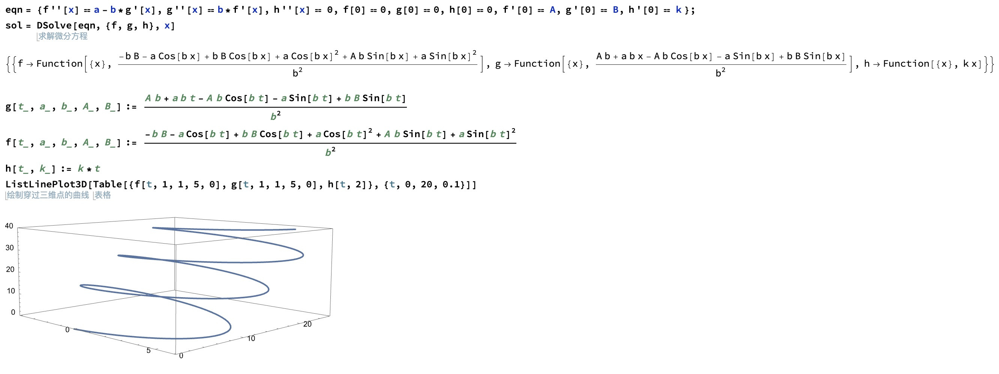

## Animation

### 2D

In [13]:
import matplotlib.pyplot as plt
plt.rcParams['animation.ffmpeg_path'] = '/Users/dengyujia/Desktop/ffmpeg'

In [14]:
%matplotlib inline
from matplotlib import animation
from IPython.display import HTML

a,b=1,1
A,B=5,5

# First set up the figure, the axis, and the plot element we want to animate
fig = plt.figure()
ax = plt.axes(xlim=(0, 30), ylim=(-12, 7.5))
line, = ax.plot([], [], '--', lw=1.5, color='green',label='track')
mass, = ax.plot([], [], 'mo', lw=1.5, markersize=10,label="particle")
ax.set_xlabel('y position')
ax.set_ylabel('x position')
ax.legend()

def animate(i):
    t = np.linspace(0, 26, 200)
    y1 = (A*b + a*b*t - A*b*np.cos(b*t) - a*np.sin(b*t) + b*B*np.sin(b*t))/(b**2)
    x1 = (-b*B - a*np.cos(b*t) + b*B*np.cos(b*t) + a*(np.cos(b*t))**2 + A*b*np.sin(b*t) + a*(np.sin(b*t))**2)/(b**2)
    line.set_data(y1[:i+1],x1[:i+1])
    mass.set_data(y1[i],x1[i])
    
    return line, mass,
plt.close()

anim = animation.FuncAnimation(fig, animate, frames=200, interval=20, blit=True)
HTML(anim.to_html5_video())

### 3D

In [15]:
import matplotlib.animation as animation
from mpl_toolkits.mplot3d import Axes3D

a,b=1,1
A,B=5,5
k = 2

def func(num, dataSet, Dots):   
    Dots.set_data(dataSet[0:2, :num])    
    Dots.set_3d_properties(dataSet[2, :num]) 
    return Dots
 
t = np.linspace(0,25,100)
y2 = (A*b + a*b*t - A*b*np.cos(b*t) - a*np.sin(b*t) + b*B*np.sin(b*t))/(b**2)
x2 = (-b*B - a*np.cos(b*t) + b*B*np.cos(b*t) + a*(np.cos(b*t))**2 + A*b*np.sin(b*t) + a*(np.sin(b*t))**2)/(b**2)
dataSet = np.array([x2, y2, t])
numDataPoints = len(t)
 
# GET SOME MATPLOTLIB OBJECTS
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

Dots = plt.plot(dataSet[0], dataSet[1], dataSet[2], lw=1, c='m', marker='o')[0]  

# AXES PROPERTIES
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Trajectory of particle')

plt.close()

# Creating the Animation object
line_ani = animation.FuncAnimation(fig, func, frames=numDataPoints, \
                                   fargs=(dataSet,Dots), interval=50, blit=False)

HTML(line_ani.to_html5_video())